# CRANTpy Tutorial: Exploring the Ant Brain Connectome

This tutorial will guide you through the main features of CRANTpy, showing you how to:

1. **Query neurons** based on anatomical and functional criteria
2. **Access morphological data** including meshes and skeletons  
3. **Analyze neural populations** and their properties
4. **Visualize neurons** in 3D space
5. **Work with different dataset versions**

Let's start by importing CRANTpy and setting up the environment.

In [1]:
# Import CRANTpy and other necessary libraries
import crantpy as cp
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Set up logging to see progress
cp.set_logging_level("INFO")

print("CRANTpy loaded successfully!")
print(f"Default dataset: {cp.CRANT_DEFAULT_DATASET}")

CRANTpy loaded successfully!
Default dataset: latest


## 1. Authentication Setup

Before we can access the data, we need to authenticate with the CAVE service. This is typically a one-time setup.

In [2]:
# Generate and save authentication token (uncomment if first time)
# cp.generate_cave_token(save=True)

# Test connection
try:
    client = cp.get_cave_client()
    print(f"Successfully connected to datastack: {client.datastack_name}")
    print(f"Server: {client.server_address}")
except Exception as e:
    print(f"Connection failed: {e}")
    print("Please run: cp.generate_cave_token(save=True)")

Successfully connected to datastack: kronauer_ant
Server: https://proofreading.zetta.ai


## 2. Exploring Available Data

Let's start by exploring what data is available in the CRANT dataset.

In [3]:
# Get all available annotation fields
available_fields = cp.NeuronCriteria.available_fields()
print(f"Available annotation fields ({len(available_fields)}):")
for field in sorted(available_fields):
    print(f"  - {field}")

Available annotation fields (25):
  - alternative_names
  - annotator_notes
  - cave_table
  - cell_class
  - cell_instance
  - cell_subtype
  - cell_type
  - date_proofread
  - flow
  - hemilineage
  - known_nt
  - known_nt_source
  - nerve
  - ngl_link
  - nucleus_id
  - proofread
  - proofreader_notes
  - region
  - root_id
  - side
  - status
  - super_class
  - tract
  - user_annotator
  - user_proofreader


In [4]:
# Get overview of the dataset
all_annotations = cp.get_all_seatable_annotations()
print(f"Total neurons in dataset: {len(all_annotations):,}")
print(f"Dataset shape: {all_annotations.shape}")
print("\nFirst few rows:")
display(all_annotations.head())

Total neurons in dataset: 6,050
Dataset shape: (6050, 30)

First few rows:


,root_id,root_id_processed,supervoxel_id,position,nucleus_id,nucleus_position,root_position,cave_table,proofread,status,...,cell_subtype,cell_instance,known_nt,known_nt_source,alternative_names,annotator_notes,user_annotator,user_proofreader,ngl_link,date_proofread
0,576460752700282748,None,74170512125421134,"[32782, 30214, 1532]",72691394107456688,"[37306, 31317, 1405]","[37306, 31317, 1405]",None,False,"[DAMAGED, PARTIALLY_PROOFREAD, TRACING_ISSUE]",...,None,None,acetylcholine,"Tanaka et al., 2012 (immuno, mALT, drosophila ...",None,None,[lindsey_lopes],[lindsey_lopes],https://spelunker.cave-explorer.org/#!middleau...,None
1,576460752681552812,None,74100212167609429,"[32121, 31509, 1702]",72621025497478503,"[36772, 28974, 1953]","[36772, 28974, 1953]",None,True,[BACKBONE_PROOFREAD],...,None,None,acetylcholine,"Tanaka et al., 2012 (immuno, mALT, drosophila ...",None,None,[lindsey_lopes],[lindsey_lopes],https://spelunker.cave-explorer.org/#!middleau...,None
2,576460752666303418,None,74169069687405059,"[33220, 8787, 4046]",72620682436952978,"[33727, 8389, 4054]","[33727, 8389, 4054]",None,False,"[PARTIALLY_PROOFREAD, TRACING_ISSUE]",...,None,None,"acetylcholine, sNPF","Barnstedt et al. 2016 (immuno, KCs, drosophila...",None,None,[lindsey_lopes],[lindsey_lopes],https://spelunker.cave-explorer.org/#!middleau...,None
3,576460752722405178,None,74100212167388307,"[32442, 31693, 1618]",72621025497491534,"[36266, 31490, 2021]","[36266, 31490, 2021]",None,False,"[PARTIALLY_PROOFREAD, TRACING_ISSUE]",...,None,None,acetylcholine,"Tanaka et al., 2012 (immuno, mALT, drosophila ...",None,None,[lindsey_lopes],[lindsey_lopes],https://spelunker.cave-explorer.org/#!middleau...,None
4,576460752773799604,None,74100280887219649,"[32484, 32119, 1756]",72691394308791443,"[37240, 29878, 2178]","[37240, 29878, 2178]",None,True,[BACKBONE_PROOFREAD],...,None,None,acetylcholine,"Tanaka et al., 2012 (immuno, mALT, drosophila ...",None,None,[lindsey_lopes],[lindsey_lopes],https://spelunker.cave-explorer.org/#!middleau...,None


Top 10 cell classes:
cell_class
FBc                            169
ER                             137
olfactory_projection_neuron    109
descending_neuron              108
ER_input                        95
FBt                             91
PBt                             63
pars_intercerebralis            58
EBc                             48
spiny_kenyon_cell               17
Name: count, dtype: int64


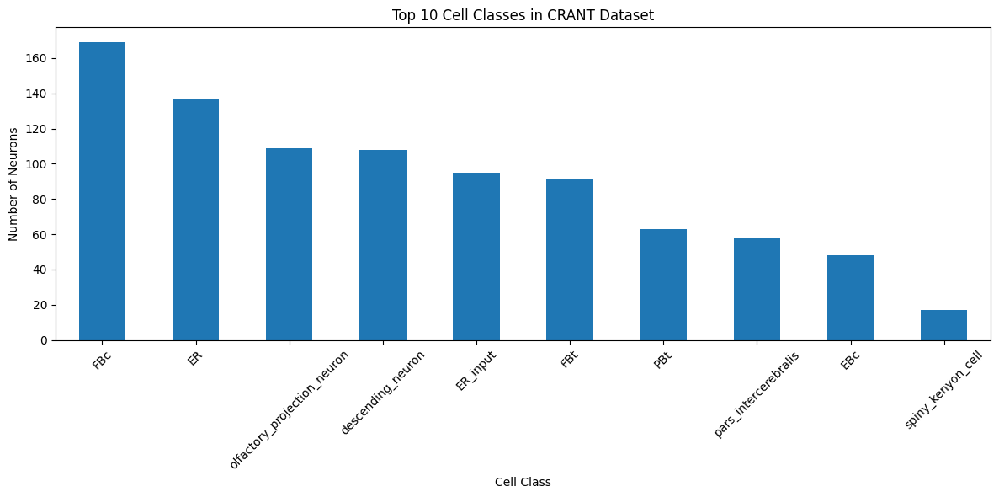

In [5]:
# Explore the distribution of cell classes
cell_class_counts = all_annotations['cell_class'].value_counts()
print("Top 10 cell classes:")
print(cell_class_counts.head(10))

# Visualize
plt.figure(figsize=(12, 6))
cell_class_counts.head(10).plot(kind='bar')
plt.title('Top 10 Cell Classes in CRANT Dataset')
plt.xlabel('Cell Class')
plt.ylabel('Number of Neurons')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

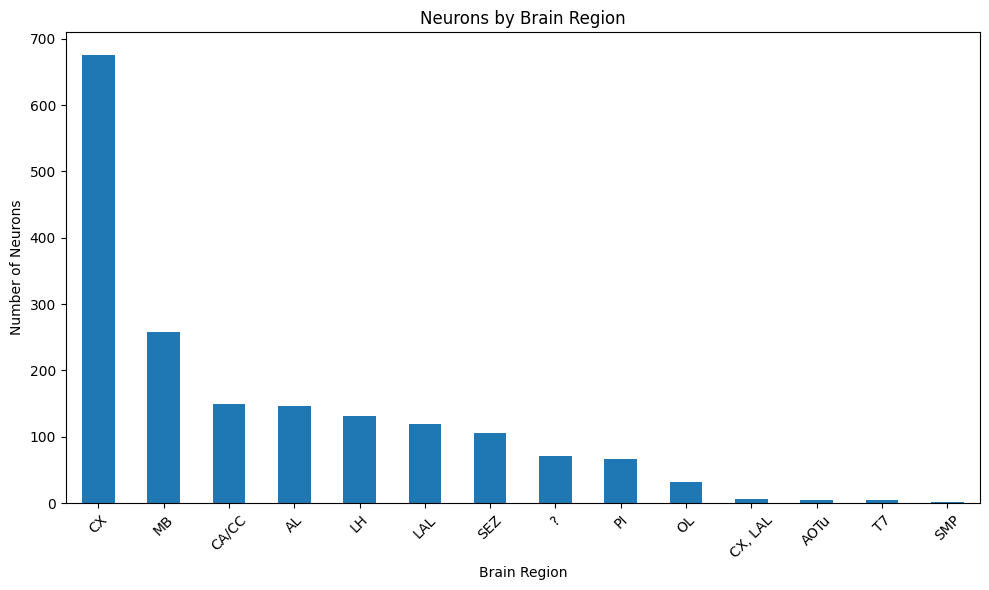

In [6]:
# Explore brain regions
# Each neuron can belong to multiple regions, therefore each entry is a list

from collections import Counter

# Flatten the region lists and count occurrences
region_lists = all_annotations['region'].dropna().tolist()
flat_regions = [region for sublist in region_lists for region in (sublist if isinstance(sublist, list) else [sublist])]
region_counts = pd.Series(Counter(flat_regions)).sort_values(ascending=False)

# Visualize
plt.figure(figsize=(10, 6))
region_counts.plot(kind='bar')
plt.title('Neurons by Brain Region')
plt.xlabel('Brain Region')
plt.ylabel('Number of Neurons')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## 3. Querying Neurons with NeuronCriteria

The `NeuronCriteria` class is the main interface for filtering neurons based on their annotations.

In [7]:
# Query neurons by cell class
olfactory_projection_neuron = cp.NeuronCriteria(cell_class='olfactory_projection_neuron')
opn_ids = olfactory_projection_neuron.get_roots()
print(f"Found {len(opn_ids)} olfactory projection neurons")

# Query with multiple criteria
left_projection_neurons = cp.NeuronCriteria(
    cell_class='olfactory_projection_neuron',
    side='left'
)
left_pn_ids = left_projection_neurons.get_roots()
print(f"Found {len(left_pn_ids)} left projection neurons")

Found 107 olfactory projection neurons


Found 37 left projection neurons


In [8]:
all_annotations

,root_id,root_id_processed,supervoxel_id,position,nucleus_id,nucleus_position,root_position,cave_table,proofread,status,...,cell_subtype,cell_instance,known_nt,known_nt_source,alternative_names,annotator_notes,user_annotator,user_proofreader,ngl_link,date_proofread
0,576460752700282748,None,74170512125421134,"[32782, 30214, 1532]",72691394107456688,"[37306, 31317, 1405]","[37306, 31317, 1405]",None,False,"[DAMAGED, PARTIALLY_PROOFREAD, TRACING_ISSUE]",...,None,None,acetylcholine,"Tanaka et al., 2012 (immuno, mALT, drosophila ...",None,None,[lindsey_lopes],[lindsey_lopes],https://spelunker.cave-explorer.org/#!middleau...,None
1,576460752681552812,None,74100212167609429,"[32121, 31509, 1702]",72621025497478503,"[36772, 28974, 1953]","[36772, 28974, 1953]",None,True,[BACKBONE_PROOFREAD],...,None,None,acetylcholine,"Tanaka et al., 2012 (immuno, mALT, drosophila ...",None,None,[lindsey_lopes],[lindsey_lopes],https://spelunker.cave-explorer.org/#!middleau...,None
2,576460752666303418,None,74169069687405059,"[33220, 8787, 4046]",72620682436952978,"[33727, 8389, 4054]","[33727, 8389, 4054]",None,False,"[PARTIALLY_PROOFREAD, TRACING_ISSUE]",...,None,None,"acetylcholine, sNPF","Barnstedt et al. 2016 (immuno, KCs, drosophila...",None,None,[lindsey_lopes],[lindsey_lopes],https://spelunker.cave-explorer.org/#!middleau...,None
3,576460752722405178,None,74100212167388307,"[32442, 31693, 1618]",72621025497491534,"[36266, 31490, 2021]","[36266, 31490, 2021]",None,False,"[PARTIALLY_PROOFREAD, TRACING_ISSUE]",...,None,None,acetylcholine,"Tanaka et al., 2012 (immuno, mALT, drosophila ...",None,None,[lindsey_lopes],[lindsey_lopes],https://spelunker.cave-explorer.org/#!middleau...,None
4,576460752773799604,None,74100280887219649,"[32484, 32119, 1756]",72691394308791443,"[37240, 29878, 2178]","[37240, 29878, 2178]",None,True,[BACKBONE_PROOFREAD],...,None,None,acetylcholine,"Tanaka et al., 2012 (immuno, mALT, drosophila ...",None,None,[lindsey_lopes],[lindsey_lopes],https://spelunker.cave-explorer.org/#!middleau...,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6045,576460752639537593,None,73606393940355921,"[24582, 13203, 1326]",None,[],[],None,None,[PARTIALLY_PROOFREAD],...,None,None,None,None,None,None,[matthew_gruner],[matthew_gruner],https://spelunker.cave-explorer.org/#!middleau...,2025-09-12
6046,576460752653526238,None,73606600099015809,"[25037, 15414, 1415]",None,[],[],None,None,[BACKBONE_PROOFREAD],...,None,None,None,None,None,None,[matthew_gruner],[matthew_gruner],https://spelunker.cave-explorer.org/#!middleau...,2025-09-15
6047,576460752682339873,None,73606325086862744,"[24920, 11355, 892]",None,[],[],None,None,[BACKBONE_PROOFREAD],...,None,None,None,None,None,None,[matthew_gruner],[matthew_gruner],https://spelunker.cave-explorer.org/#!middleau...,2025-09-22
6048,576460752666055843,None,None,"[24586, 13410, 1216]",None,[],[],None,None,[PARTIALLY_PROOFREAD],...,None,None,None,None,None,None,[matthew_gruner],[matthew_gruner],https://spelunker.cave-explorer.org/#!middleau...,2025-09-30


In [9]:
# Use regex for complex matching
ExR_subtypes = cp.NeuronCriteria(
    cell_type='ExR',  # Matches Ex__b, etc.
    regex=True
)
ExR_subtype_ids = ExR_subtypes.get_roots()
print(f"Found {len(ExR_subtype_ids)} ExR subtype neurons")

# Get their annotations to see the types
exR_annotations = cp.get_annotations(ExR_subtypes)
print("\nExR subtypes found:")
print(exR_annotations['cell_type'].value_counts())

Found 6 ExR subtype neurons

ExR subtypes found:
cell_type
ExR1    4
ExR2    2
Name: count, dtype: int64


In [10]:
# Query neurons from specific tracts
malt_neurons = cp.NeuronCriteria(tract='mALT')
malt_ids = malt_neurons.get_roots()
print(f"Found {len(malt_ids)} neurons in mALT tract")

# Get their detailed annotations
malt_annotations = cp.get_annotations(malt_neurons)
print("\nmALT neuron types:")
print(malt_annotations['cell_class'].value_counts())

Found 2275 neurons in mALT tract

mALT neuron types:
cell_class
olfactory_projection_neuron    68
AL_T7_input                     5
Name: count, dtype: int64


## 4. Working with Neuron Morphology

CRANTpy provides access to both mesh and skeleton representations of neurons.

In [11]:
# Get a sample neuron for morphological analysis
sample_neuron_id = opn_ids[0]
print(f"Analyzing neuron: {sample_neuron_id}")

# Get the neuron's skeleton - set omit_failures=True to handle problematic neurons gracefully
skeleton = cp.get_skeletons([sample_neuron_id])
print(f"\nSkeleton properties:")
print(f"  Nodes: {len(skeleton.nodes):,}")
print(f"  Cable length: {skeleton.cable_length[0]} nm")
print(f"  Branch points: {skeleton.n_branch_points[0]}")
print(f"  End points: {skeleton.n_endpoints[0]}")

Analyzing neuron: 576460752700282748


2025-10-01 09:57:56 - INFO - get_versions()
2025-10-01 09:57:56 - INFO - endpoint: {skeleton_server_address}/skeletoncache/api/versions
2025-10-01 09:57:56 - INFO - url: https://data.proofreading.zetta.ai/skeletoncache/api/versions
2025-10-01 09:57:56 - INFO - response: <Response [200]>
2025-10-01 09:57:56 - INFO - versions: <class 'list'> [-1, 0, 1, 2, 3, 4]
2025-10-01 09:57:56 - INFO - SkeletonService version: 0.22.48
2025-10-01 09:57:57 - INFO - get_skeleton() response contains content of size 6727 bytes



Skeleton properties:
  Nodes: 221
  Cable length: 1075895.125 nm
  Branch points: 0
  End points: None


In [12]:
# Get the neuron's mesh - also handle potential failures gracefully
try:
    mesh = cp.get_mesh_neuron(sample_neuron_id)
    print(f"Mesh properties:")
    print(f"  Vertices: {len(mesh.vertices):,}")
    print(f"  Faces: {len(mesh.faces):,}")
    print(f"  Volume: {mesh.volume:.2f} cubic microns")
except Exception as e:
    print(f"⚠ Could not get mesh for neuron {sample_neuron_id}: {e}")
    print("This may be due to mesh configuration issues in the dataset.")

Mesh properties:
  Vertices: 238,432
  Faces: 478,609
  Volume: 135639679325.33 cubic microns


In [13]:
# Analyze morphology of multiple neurons
sample_opn_ids = opn_ids[:10]  # Take first 10 projection neurons
print(f"Attempting to get skeletons for {len(sample_opn_ids)} neurons...")

# Get skeletons with failure handling
try:
    opn_skeletons = cp.get_skeletons(sample_opn_ids)
    print(f"Successfully obtained {len(opn_skeletons)} skeletons out of {len(sample_opn_ids)} attempts")
except Exception as e:
    print(f"Error getting skeletons: {e}")
    print("⚠ There may be issues with the mesh data for some of these neurons.")

# Extract morphological measurements if we have any skeletons
if len(opn_skeletons) > 0:
    morphology_data = []
    for skel in opn_skeletons:
        morphology_data.append({
            'neuron_id': skel.id,
            'cable_length': skel.cable_length,
            'n_branch_points': skel.n_branch_points,
            'n_endpoints': skel.n_endpoints,
        })

    morphology_df = pd.DataFrame(morphology_data)
    print("Morphological analysis:")
    display(morphology_df.describe())

2025-10-01 09:58:02 - INFO - get_versions()
2025-10-01 09:58:02 - INFO - get_versions()


Attempting to get skeletons for 10 neurons...


2025-10-01 09:58:02 - INFO - get_versions()
Fetching skeletons:   0%|          | 0/10 [00:00<?, ?it/s]2025-10-01 09:58:02 - INFO - get_versions()
2025-10-01 09:58:02 - INFO - get_versions()
2025-10-01 09:58:02 - INFO - endpoint: {skeleton_server_address}/skeletoncache/api/versions
2025-10-01 09:58:02 - INFO - get_versions()
2025-10-01 09:58:02 - INFO - endpoint: {skeleton_server_address}/skeletoncache/api/versions
2025-10-01 09:58:02 - INFO - endpoint: {skeleton_server_address}/skeletoncache/api/versions
2025-10-01 09:58:02 - INFO - endpoint: {skeleton_server_address}/skeletoncache/api/versions
2025-10-01 09:58:02 - INFO - endpoint: {skeleton_server_address}/skeletoncache/api/versions
2025-10-01 09:58:02 - INFO - url: https://data.proofreading.zetta.ai/skeletoncache/api/versions
2025-10-01 09:58:02 - INFO - endpoint: {skeleton_server_address}/skeletoncache/api/versions
2025-10-01 09:58:02 - INFO - url: https://data.proofreading.zetta.ai/skeletoncache/api/versions
2025-10-01 09:58:02 - 

Successfully obtained 10 skeletons out of 10 attempts
Morphological analysis:


,neuron_id,cable_length,n_branch_points
count,1.000000e+01,1.000000e+01,10.0
mean,5.764608e+17,1.252708e+06,0.0
std,4.273041e+07,1.694110e+05,0.0
min,5.764608e+17,9.352012e+05,0.0
25%,5.764608e+17,1.166859e+06,0.0
50%,5.764608e+17,1.262665e+06,0.0
75%,5.764608e+17,1.380023e+06,0.0
max,5.764608e+17,1.469019e+06,0.0


/var/folders/y6/xn2dyw2s14b79mrpmzrhykhc0000gn/T/ipykernel_43634/3239346219.py:18: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  morphology_df['n_endpoints'] = morphology_df['n_endpoints'].fillna(0)


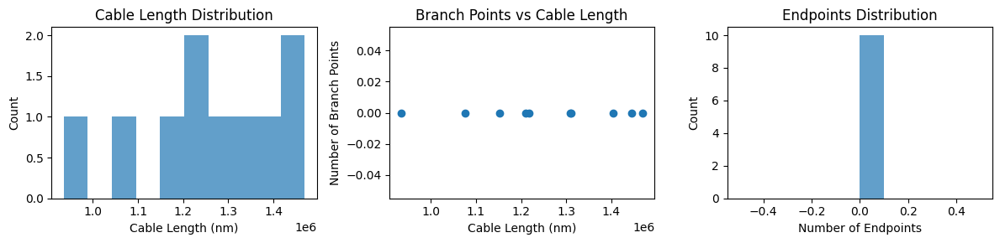

In [14]:
# Visualize morphological distributions
fig, axes = plt.subplots(1, 3, figsize=(12, 3))

# Cable length distribution
axes[0].hist(morphology_df['cable_length'], bins=10, alpha=0.7)
axes[0].set_title('Cable Length Distribution')
axes[0].set_xlabel('Cable Length (nm)')
axes[0].set_ylabel('Count')

# Branch points vs cable length
axes[1].scatter(morphology_df['cable_length'], morphology_df['n_branch_points'])
axes[1].set_title('Branch Points vs Cable Length')
axes[1].set_xlabel('Cable Length (nm)')
axes[1].set_ylabel('Number of Branch Points')

# Endpoints distribution
# convert none to 0 if necessary
morphology_df['n_endpoints'] = morphology_df['n_endpoints'].fillna(0)
axes[2].hist(morphology_df['n_endpoints'], bins=10, alpha=0.7)
axes[2].set_title('Endpoints Distribution')
axes[2].set_xlabel('Number of Endpoints')
axes[2].set_ylabel('Count')

plt.tight_layout()
plt.show()

## 5. Visualization

CRANTpy integrates with navis for 3D visualization of neurons.

In [15]:
# 3D visualization of skeleton (requires plotly)
try:
    # Plot the skeleton in 3D
    skeleton.plot3d(backend='plotly')
except ImportError:
    print("Plotly not available. Install with: pip install plotly")
except Exception as e:
    print(f"Visualization error: {e}")

In [16]:
# 3D visualization of mesh
try:
    # Plot the mesh in 3D
    mesh.plot3d(backend='plotly')
except ImportError:
    print("Plotly not available. Install with: pip install plotly")
except Exception as e:
    print(f"Visualization error: {e}")

In [17]:
# Plot multiple neurons together in the same 3D plot
try:
    import plotly.graph_objects as go
    
    # Get a few different neuron types
    sample_skeletons = cp.get_skeletons(sample_opn_ids[:3])
    
    # Create a single figure
    fig = sample_skeletons.plot3d(backend='plotly', inline=False)
    fig.show()
    
except Exception as e:
    print(f"Multi-neuron visualization error: {e}")

2025-10-01 09:58:05 - INFO - get_versions()
2025-10-01 09:58:05 - INFO - get_versions()
Fetching skeletons:   0%|          | 0/3 [00:00<?, ?it/s]2025-10-01 09:58:05 - INFO - get_versions()
2025-10-01 09:58:05 - INFO - endpoint: {skeleton_server_address}/skeletoncache/api/versions
2025-10-01 09:58:05 - INFO - endpoint: {skeleton_server_address}/skeletoncache/api/versions
2025-10-01 09:58:05 - INFO - endpoint: {skeleton_server_address}/skeletoncache/api/versions
2025-10-01 09:58:05 - INFO - url: https://data.proofreading.zetta.ai/skeletoncache/api/versions
2025-10-01 09:58:05 - INFO - url: https://data.proofreading.zetta.ai/skeletoncache/api/versions
2025-10-01 09:58:05 - INFO - url: https://data.proofreading.zetta.ai/skeletoncache/api/versions
2025-10-01 09:58:05 - INFO - response: <Response [200]>
2025-10-01 09:58:05 - INFO - versions: <class 'list'> [-1, 0, 1, 2, 3, 4]
2025-10-01 09:58:05 - INFO - SkeletonService version: 0.22.48
2025-10-01 09:58:05 - INFO - response: <Response [200]>

## 6. ID Management and Updates

Neuron IDs can change over time due to proofreading. CRANTpy helps manage these changes.

In [19]:
# Check if our sample IDs are current
sample_ids = opn_ids[:5]
are_current = cp.is_latest_roots(sample_ids)

print(f"Checking {len(sample_ids)} neuron IDs:")
for i, (neuron_id, is_current) in enumerate(zip(sample_ids, are_current)):
    status = "Current" if is_current else "⚠ Outdated"
    print(f"  {neuron_id}: {status}")

Checking 5 neuron IDs:
  576460752700282748: Current
  576460752681552812: Current
  576460752722405178: Current
  576460752773799604: Current
  576460752656800770: Current


In [22]:
# Update IDs in a DataFrame
# Create a small test DataFrame
test_df = pd.DataFrame({
    'root_id': sample_ids,
    'analysis_result': np.random.randn(len(sample_ids))
})

print("Original DataFrame:")
display(test_df)

# Update IDs
updated_df = cp.update_ids(test_df, dataset="latest")

print("\nUpdated DataFrame (showing ID update info):")
display(updated_df[['old_id', 'new_id', 'confidence', 'changed']].head())

# replace old ids with new ids
# Replace old IDs with new IDs in test_df
id_map = dict(zip(updated_df['old_id'].astype(str), updated_df['new_id'].astype(str)))

# keep a copy of the original ids
test_df['root_id_original'] = test_df['root_id']

# perform the replacement (preserve values that have no mapping)
test_df['root_id'] = test_df['root_id'].astype(str).map(id_map).fillna(test_df['root_id'])

print("DataFrame after ID replacement:")
display(test_df)

Original DataFrame:


,root_id,analysis_result
0,576460752700282748,0.353122
1,576460752681552812,1.294697
2,576460752722405178,1.085224
3,576460752773799604,-0.904821
4,576460752656800770,0.336854


2025-10-01 10:00:19 - WARNING - Multiple supervoxel IDs found for 132 root IDs. Using first occurrence for each.
2025-10-01 10:00:19 - INFO - All valid root IDs are already the latest. No updates needed.



Updated DataFrame (showing ID update info):


,old_id,new_id,confidence,changed
0,576460752700282748,576460752700282748,1.0,False
1,576460752681552812,576460752681552812,1.0,False
2,576460752722405178,576460752722405178,1.0,False
3,576460752773799604,576460752773799604,1.0,False
4,576460752656800770,576460752656800770,1.0,False


DataFrame after ID replacement:


,root_id,analysis_result,root_id_original
0,576460752700282748,0.353122,576460752700282748
1,576460752681552812,1.294697,576460752681552812
2,576460752722405178,1.085224,576460752722405178
3,576460752773799604,-0.904821,576460752773799604
4,576460752656800770,0.336854,576460752656800770


## 9. Advanced Queries and Analysis

Let's explore some more advanced querying and analysis techniques.

In [25]:
# Complex query with multiple criteria
complex_criteria = cp.NeuronCriteria(
    region='MB',
    side='left',
    proofread=True,
    status=['BACKBONE_PROOFREAD']
)

complex_ids = complex_criteria.get_roots()
print(f"Found {len(complex_ids)} left MB neurons that are proofread")

# Get their detailed annotations
complex_annotations = cp.get_annotations(complex_criteria)
print("\nCell types in this population:")
print(complex_annotations['cell_class'].value_counts())

Found 29 left MB neurons that are proofread

Cell types in this population:
cell_class
olfactory_projection_neuron           18
pars_lateralis_neurosecretory_cell     1
Name: count, dtype: int64


In [28]:
# Analyze connectivity patterns by tract
tracts = all_annotations['tract'].dropna().unique()
print(f"Found {len(tracts)} tracts: {list(tracts)}")

# Analyze each tract
tract_analysis = []
for tract in tracts[:5]:  # Analyze first 5 tracts
    tract_neurons = cp.NeuronCriteria(tract=tract)
    tract_ids = tract_neurons.get_roots()
    tract_annotations = cp.get_annotations(tract_neurons)
    
    # Count unique cell classes and regions
    n_cell_classes = len(tract_annotations['cell_class'].unique())
    
    tract_analysis.append({
        'tract': tract,
        'n_neurons': len(tract_ids),
        'n_cell_class': n_cell_classes,
    })

tract_df = pd.DataFrame(tract_analysis)
print("\nTract analysis:")
display(tract_df)

Found 3 tracts: ['mALT', 'lALT', 'mlALT']

Tract analysis:


,tract,n_neurons,n_cell_class
0,mALT,2275,3
1,lALT,227,2
2,mlALT,237,2


## 10. Summary and Next Steps

This tutorial has covered the main features of CRANTpy:

✅ **Authentication and setup**  
✅ **Exploring the dataset structure**  
✅ **Querying neurons with NeuronCriteria**  
✅ **Accessing morphological data (meshes and skeletons)**  
✅ **Population analysis and comparison**  
✅ **3D visualization**  
✅ **ID management and updates**  
✅ **Advanced querying techniques**  

### What's Next?

- **Connectivity Analysis**: Explore synaptic connections between neurons
- **Circuit Analysis**: Identify and analyze neural circuits
- **Comparative Studies**: Compare different brain regions or neuron types
- **Custom Analysis**: Develop your own analysis pipelines

### Resources

- [CRANTpy Documentation](https://social-evolution-and-behavior.github.io/crantpy/)
- [API Reference](../api/modules.rst)
- [GitHub Repository](https://github.com/Social-Evolution-and-Behavior/crantpy)
- [Issue Tracker](https://github.com/Social-Evolution-and-Behavior/crantpy/issues)

Happy exploring! 🐜🧠